In [1]:
import os
import sys
import pandas as pd

# Setting up local details:
# This should be the location of the checkout of the FS-Mol repository:
FS_MOL_CHECKOUT_PATH = os.path.join("/data/local/apps/", "Meta-Learning", "FS-Mol")
FS_MOL_DATASET_PATH = os.path.join("/data/local/apps/", "Meta-Learning", "FS-Mol", "datasets")

os.chdir(FS_MOL_CHECKOUT_PATH)
sys.path.insert(0, FS_MOL_CHECKOUT_PATH)

from fs_mol.plotting.utils import (
    highlight_max_all, 
    plot_all_assays, 
    load_data,
    expand_values,
    plot_task_performances_by_id,
    box_plot,
    plot_by_size,
    plot_by_size_new,
    get_aggregates_across_sizes
)

In [2]:
# Configure this to contain all the models that you want to look at.
# Dict keys are human readable names, values are the path to the summary produced by collect_eval_runs.py
results_path = os.path.join(FS_MOL_CHECKOUT_PATH, "outputs")

# a dictionary summarising all models to be compared. Add new paths here as desired.
model_summaries = {
    "kNN": os.path.join(results_path, "FSMol_Eval_kNN_2023-01-31_14-35-49", "summary", "kNN_summary.csv"),
    "kNN_similar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_16-28-43", "summary", "kNN_summary.csv"),
    "kNN_dissimilar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_17-19-58", "summary", "kNN_summary.csv"),
    "ProtoNet": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-15_12-21-54", "summary", "ProtoNet_summary.csv"),
    "ProtoNet_similar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-23_20-06-40", "summary", "ProtoNet_summary.csv"),
    "ProtoNet_dissimilar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-24_00-15-11", "summary", "ProtoNet_summary.csv"),
#     "kNN": os.path.join(results_path, "kNN_summary.csv"),
}
# Generated plots will be stored here, if you want to keep them. None disables saving.
plot_output_dir = os.path.join(results_path, "plots")
all_tasks_output_dir = os.path.join(results_path, "plots/all_tasks")
os.makedirs(plot_output_dir, exist_ok=True)
os.makedirs(all_tasks_output_dir, exist_ok=True)

In [3]:
data = load_data(model_summaries)

Loading data for kNN from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_kNN_2023-01-31_14-35-49/summary/kNN_summary.csv.
Loading data for kNN_similar from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_kNN_2023-02-23_16-28-43/summary/kNN_summary.csv.
Loading data for kNN_dissimilar from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_kNN_2023-02-23_17-19-58/summary/kNN_summary.csv.
Loading data for ProtoNet from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_ProtoNet_2023-02-15_12-21-54/summary/ProtoNet_summary.csv.
Loading data for ProtoNet_similar from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_ProtoNet_2023-02-23_20-06-40/summary/ProtoNet_summary.csv.
Loading data for ProtoNet_dissimilar from /data/local/apps/Meta-Learning/FS-Mol/outputs/FSMol_Eval_ProtoNet_2023-02-24_00-15-11/summary/ProtoNet_summary.csv.


/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:530: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  merged_df.groupby(["TASK_ID"])


## Highlight the best result for each task

In [4]:
styled_df = data.style.apply(lambda row: highlight_max_all(row), axis=1)
# To save for exporting purposes, uncomment this (requires `pip install xlsxwriter`)
styled_df.to_excel(os.path.join(plot_output_dir, f"highlighted_comparison.xlsx"), engine='xlsxwriter')

styled_df

,TASK_ID,fraction_positive_train,fraction_positive_test,16_train (kNN),32_train (kNN),64_train (kNN),128_train (kNN),256_train (kNN),16_train (kNN_similar),32_train (kNN_similar),64_train (kNN_similar),128_train (kNN_similar),256_train (kNN_similar),16_train (kNN_dissimilar),32_train (kNN_dissimilar),64_train (kNN_dissimilar),128_train (kNN_dissimilar),256_train (kNN_dissimilar),16_train (ProtoNet),32_train (ProtoNet),64_train (ProtoNet),128_train (ProtoNet),256_train (ProtoNet),16_train (ProtoNet_similar),32_train (ProtoNet_similar),64_train (ProtoNet_similar),128_train (ProtoNet_similar),256_train (ProtoNet_similar),16_train (ProtoNet_dissimilar),32_train (ProtoNet_dissimilar),64_train (ProtoNet_dissimilar),128_train (ProtoNet_dissimilar),256_train (ProtoNet_dissimilar)
0,1006005,0.494141,0.491733,0.557+/-0.04,0.555+/-0.038,0.529+/-0.037,0.554+/-0.037,nan,0.664+/-0.254,0.626+/-0.2,0.54+/-0.199,0.573+/-0.196,nan,0.546+/-0.041,0.551+/-0.041,0.532+/-0.027,0.543+/-0.032,nan,0.551+/-0.052,0.572+/-0.047,0.595+/-0.028,0.6+/-0.037,nan,0.736+/-0.27,0.719+/-0.189,0.666+/-0.176,0.704+/-0.258,nan,0.553+/-0.048,0.573+/-0.045,0.588+/-0.031,0.594+/-0.051,nan
1,1066254,0.494358,0.482319,0.596+/-0.061,0.652+/-0.035,0.723+/-0.064,0.721+/-0.121,nan,0.649+/-0.067,0.661+/-0.029,0.727+/-0.073,0.716+/-0.1,nan,0.486+/-0.107,0.582+/-0.132,0.635+/-0.175,nan,nan,0.722+/-0.064,0.788+/-0.049,0.814+/-0.042,0.822+/-0.133,nan,0.773+/-0.059,0.798+/-0.051,0.819+/-0.048,0.822+/-0.133,nan,0.607+/-0.127,0.728+/-0.127,0.849+/-0.255,nan,nan
2,1119333,0.500000,0.457743,0.636+/-0.058,0.696+/-0.046,0.748+/-0.032,0.784+/-0.027,0.811+/-0.036,0.806+/-0.039,0.783+/-0.067,0.786+/-0.038,0.802+/-0.032,0.823+/-0.04,0.517+/-0.079,0.534+/-0.116,0.533+/-0.096,0.531+/-0.141,0.439+/-0.188,0.796+/-0.043,0.805+/-0.031,0.83+/-0.019,0.851+/-0.012,0.86+/-0.032,0.888+/-0.048,0.859+/-0.05,0.852+/-0.024,0.862+/-0.012,0.867+/-0.031,0.688+/-0.094,0.654+/-0.128,0.706+/-0.142,0.713+/-0.158,0.853+/-0.198
3,1243967,0.500000,0.438123,0.592+/-0.039,0.636+/-0.051,0.666+/-0.029,0.672+/-0.037,nan,0.673+/-0.052,0.671+/-0.036,0.68+/-0.033,0.682+/-0.037,nan,0.377+/-0.103,0.334+/-0.117,0.288+/-0.265,0.4+/-nan,nan,0.786+/-0.033,0.819+/-0.041,0.839+/-0.014,0.859+/-0.026,nan,0.857+/-0.042,0.856+/-0.027,0.86+/-0.024,0.861+/-0.028,nan,0.472+/-0.138,0.424+/-0.163,0.372+/-0.189,0.417+/-nan,nan
4,1243970,0.500000,0.441777,0.593+/-0.04,0.62+/-0.037,0.663+/-0.033,0.695+/-0.033,nan,0.636+/-0.034,0.643+/-0.048,0.661+/-0.036,0.701+/-0.022,nan,0.46+/-0.073,0.479+/-0.074,0.563+/-0.226,0.392+/-0.215,nan,0.731+/-0.071,0.758+/-0.033,0.806+/-0.04,0.812+/-0.035,nan,0.79+/-0.086,0.789+/-0.021,0.825+/-0.036,0.823+/-0.029,nan,0.501+/-0.094,0.521+/-0.17,0.561+/-0.252,0.687+/-0.322,nan
5,1613777,0.496875,0.458936,0.506+/-0.017,0.524+/-0.02,0.545+/-0.019,0.564+/-0.014,0.586+/-0.017,0.378+/-0.082,0.459+/-0.051,0.474+/-0.056,0.498+/-0.047,0.539+/-0.03,0.51+/-0.015,0.529+/-0.022,0.55+/-0.018,0.571+/-0.014,0.592+/-0.016,0.541+/-0.052,0.573+/-0.034,0.602+/-0.037,0.629+/-0.046,0.65+/-0.025,0.428+/-0.101,0.55+/-0.063,0.562+/-0.065,0.579+/-0.075,0.609+/-0.046,0.544+/-0.052,0.574+/-0.037,0.604+/-0.039,0.638+/-0.04,0.66+/-0.019
6,1613800,0.393750,0.453154,0.401+/-0.009,0.404+/-0.013,0.414+/-0.01,0.427+/-0.012,0.446+/-0.008,0.669+/-0.275,0.694+/-0.251,0.751+/-0.123,0.791+/-0.096,0.774+/-0.037,0.401+/-0.008,0.403+/-0.013,0.411+/-0.014,0.414+/-0.006,0.423+/-0.009,0.438+/-0.021,0.453+/-0.025,0.457+/-0.016,0.475+/-0.014,0.499+/-0.011,0.935+/-0.165,0.861+/-0.142,0.843+/-0.125,0.811+/-0.1,0.776+/-0.076,0.432+/-0.024,0.446+/-0.026,0.446+/-0.017,0.462+/-0.018,0.481+/-0.012
7,1613898,0.500000,0.552598,0.508+/-0.039,0.514+/-0.038,0.536+/-0.04,0.589+/-0.096,nan,0.737+/-0.099,0.862+/-0.138,0.777+/-0.161,0.914+/-0.12,nan,0.496+/-0.024,0.501+/-0.035,0.515+/-0.048,0.503+/-0.091,nan,0.592+/-0.033,0.623+/-0.044,0.622+/-0.037,0.661+/-0.083,nan,0.905+/-0.134,0.892+/-0.116,0.891+/-0.072,0.92+/-0.122,nan,0.557+/-0.037,0.576+/-0.05,0.558+/-0.052,0.557+/-0.081

In [5]:
# expand out from val +/- error format, and calculate delta AUPRC
data = expand_values(data, model_summaries)

/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:670: UserWarning: FixedFormatter should only be used together with FixedLocator
  assay_id_to_improv_ax.set_xticklabels(merged_df["TASK_ID"][0:-1:4], Rotation=90)


AttributeError: Text.set() got an unexpected keyword argument 'Rotation'

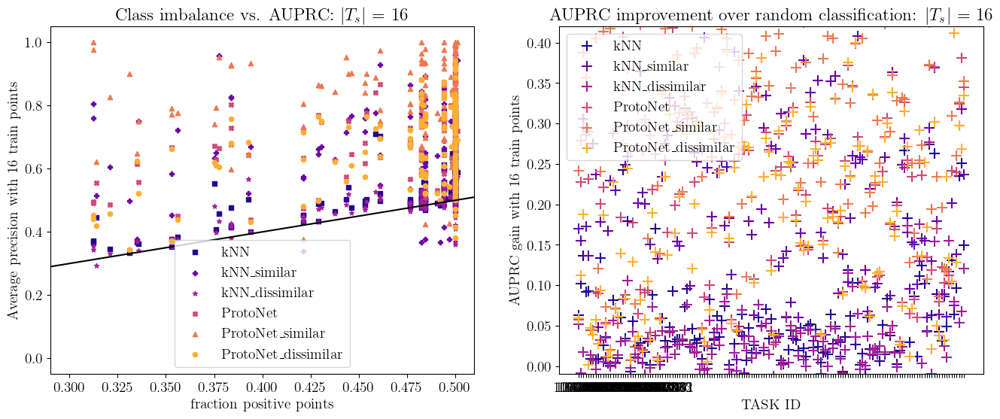

In [6]:
# This uses Latex to render plots, and requires the type1ec and type1cm packages.
# It also required the dvipng utility.
# On Debian/Ubuntu-based systems, this can be installed using `apt install cm-super texlive-latex-extra dvipng`

plot_task_performances_by_id(data, model_summaries, support_set_size = 16)

In [13]:
protein_path = os.path.join(FS_MOL_CHECKOUT_PATH, "datasets/targets", "test_proteins.csv")
ecs = pd.read_csv(protein_path)
ecs["target_id"] = ecs["target_id"].astype(int).astype(str)
ecs["chembl_id"] = ecs["chembl_id"].astype(str)
ecs["TASK_ID"] = ecs.apply(lambda row: row["chembl_id"][6:], axis = 1)

data = ecs.merge(data, on="TASK_ID")

/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:670: UserWarning: FixedFormatter should only be used together with FixedLocator
  assay_id_to_improv_ax.set_xticklabels(merged_df["TASK_ID"][0:-1:4], Rotation=90)


AttributeError: Text.set() got an unexpected keyword argument 'Rotation'

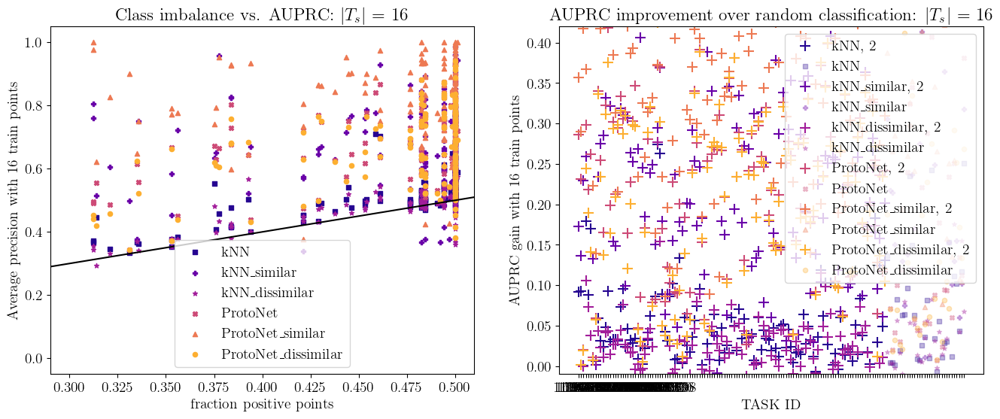

In [14]:
# the highlight class is the EC class that will be highlighted in the resulting plot. 
# You may wish to use this for comparison across different EC classes.
plot_task_performances_by_id(data, model_summaries, support_set_size = 16, highlight_class = 2)

In [15]:
aggregate_df = get_aggregates_across_sizes(data, model_summaries)

/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:725: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  empty_errors = pd.Series()
/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:725: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  empty_errors = pd.Series()
/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:725: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  empty_errors = pd.Series()
/data/local/apps/Meta-Learning/FS-Mol/fs_mol/plotting/utils.py:725: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warnin

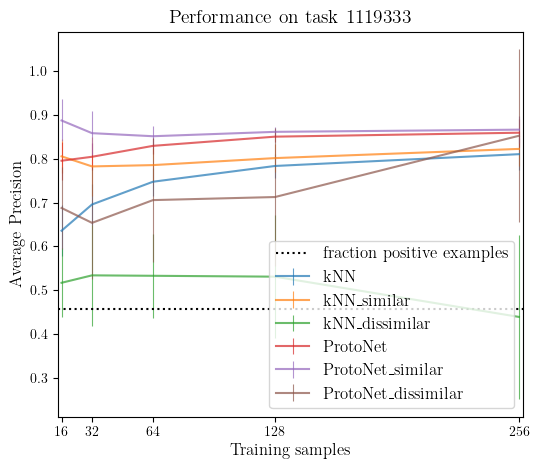

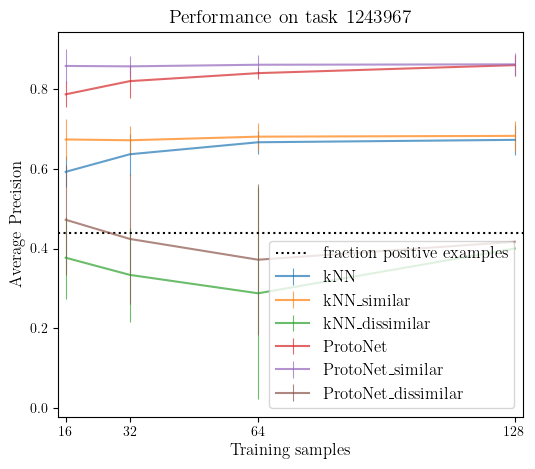

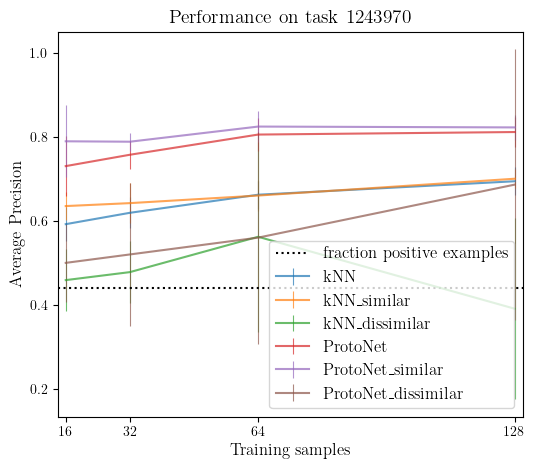

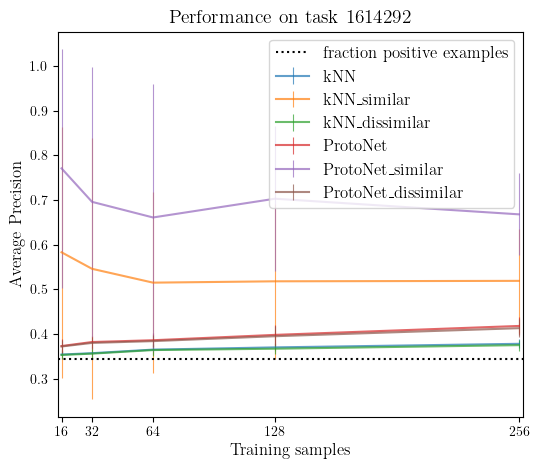

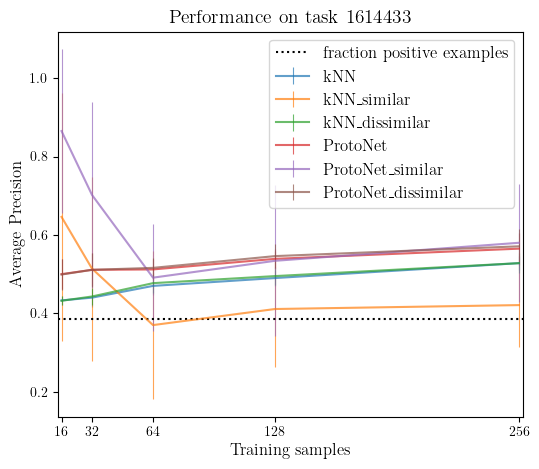

...

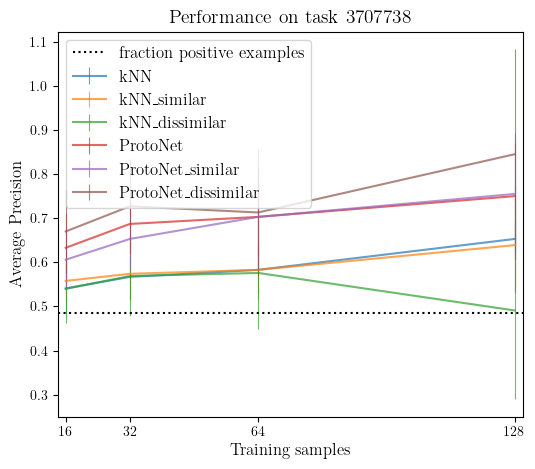

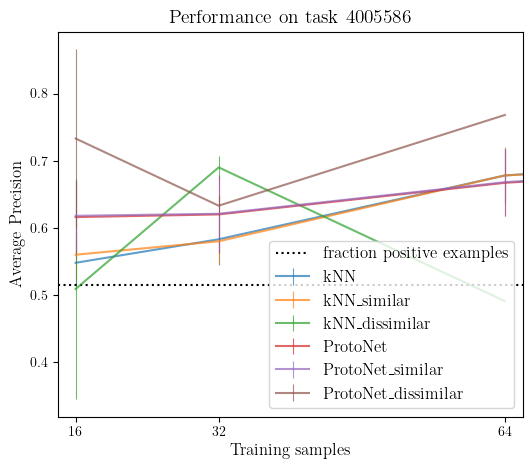

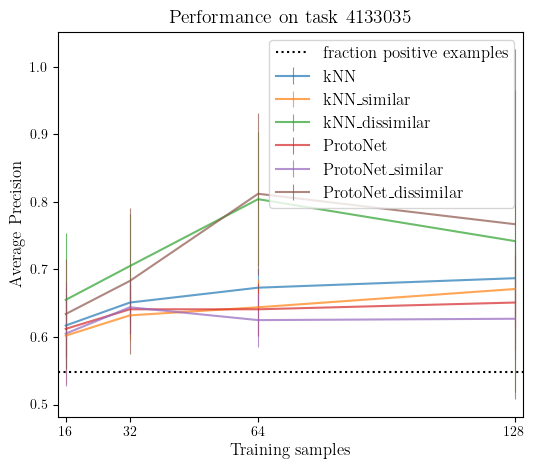

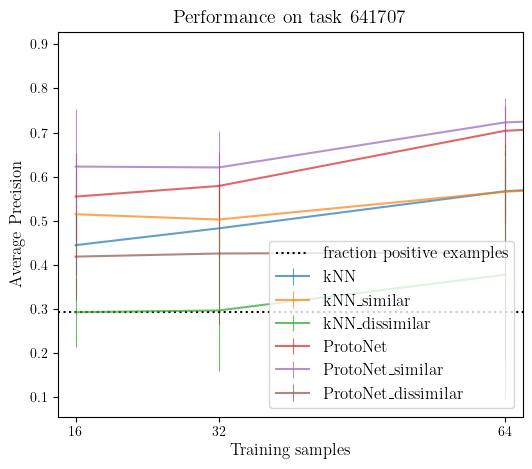

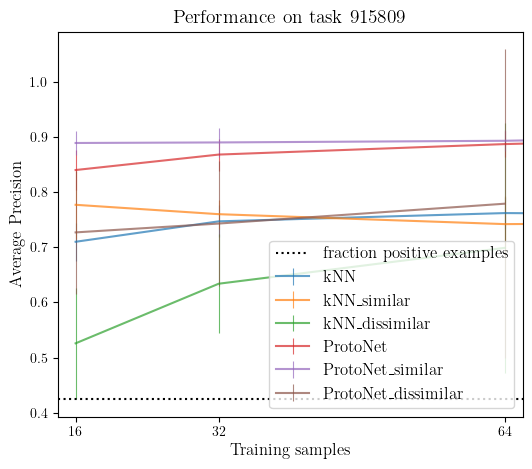

In [10]:
plot_all_assays(data, model_summaries.keys(), results_dir = all_tasks_output_dir)

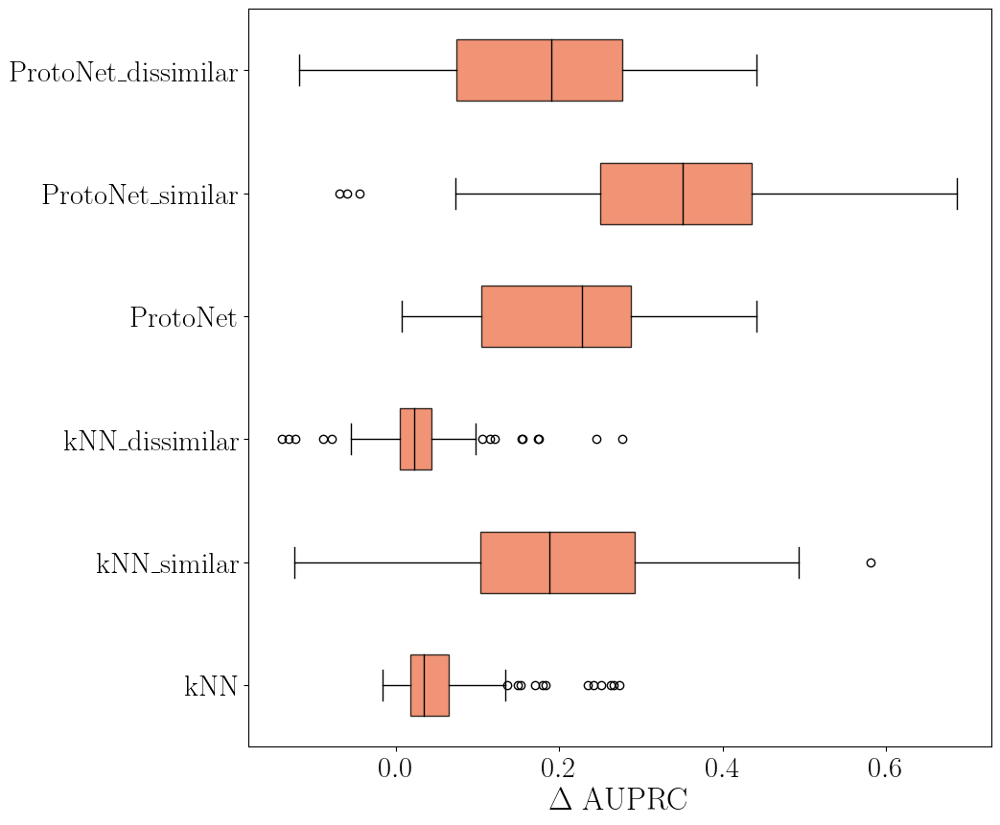

In [14]:
box_plot(data, model_summaries, support_set_size = 16, plot_output_dir=plot_output_dir)

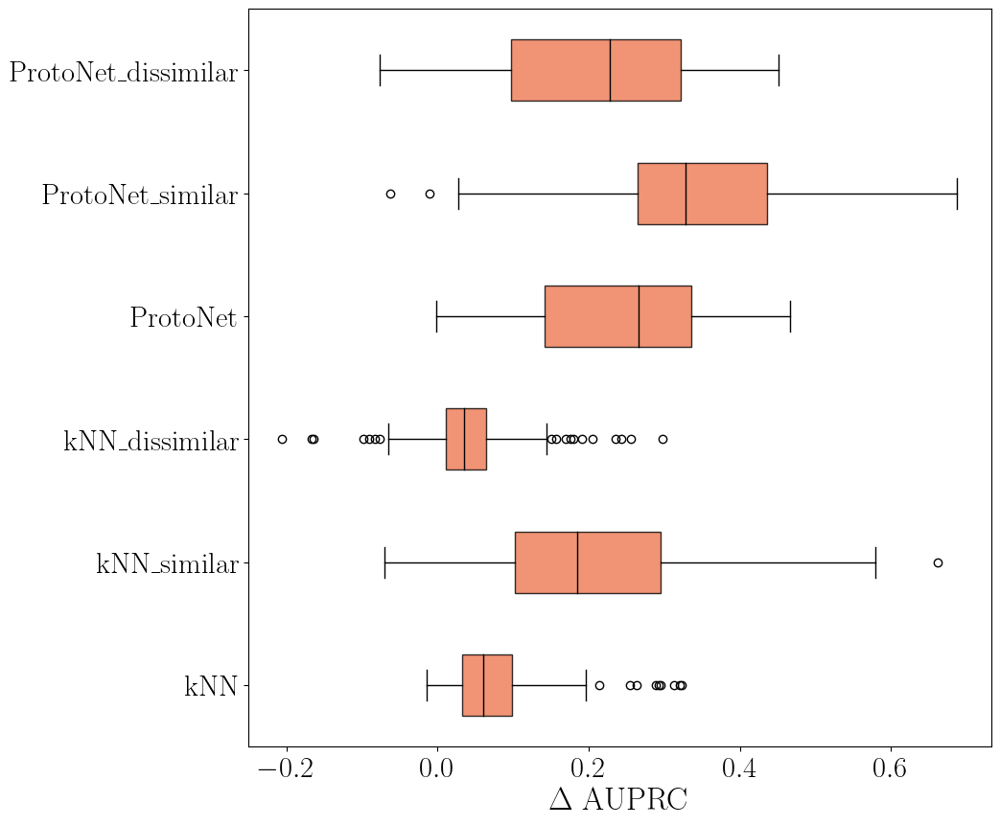

In [55]:
box_plot(data, model_summaries, support_set_size = 32, plot_output_dir=plot_output_dir)

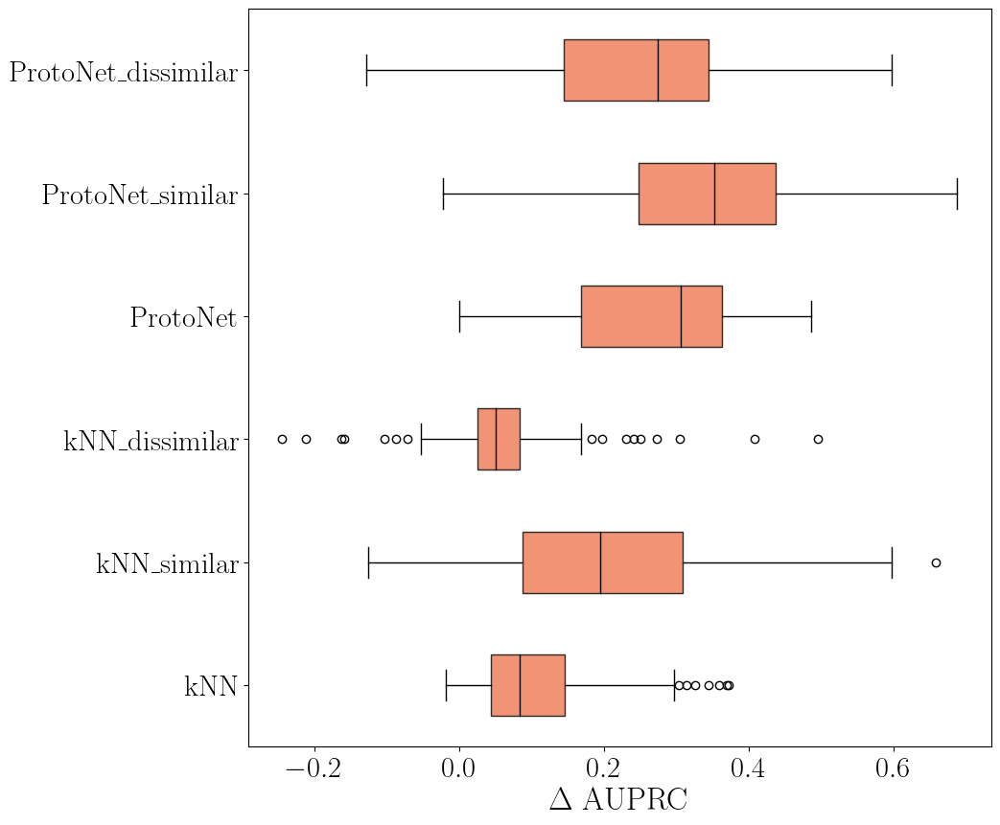

In [56]:
box_plot(data, model_summaries, support_set_size = 64, plot_output_dir=plot_output_dir)

In [9]:
aggregate_df

,16_train (kNN),16_train (kNN_similar),16_train (kNN_dissimilar),16_train (ProtoNet),16_train (ProtoNet_similar),16_train (ProtoNet_dissimilar),16_train (kNN) std,16_train (kNN_similar) std,16_train (kNN_dissimilar) std,16_train (ProtoNet) std,...,256_train (kNN_dissimilar),256_train (ProtoNet),256_train (ProtoNet_similar),256_train (ProtoNet_dissimilar),256_train (kNN) std,256_train (kNN_similar) std,256_train (kNN_dissimilar) std,256_train (ProtoNet) std,256_train (ProtoNet_similar) std,256_train (ProtoNet_dissimilar) std
EC_category,,,,,,,,,,,,,,,,,,,,,
3,0.086735,0.243335,0.019735,0.197885,0.351185,0.148185,0.018607,0.043554,0.012176,0.030573,...,0.022112,0.228826,0.298969,0.162254,0.041435,0.082360,0.028193,0.048211,0.067240,0.034962
2,0.047891,0.202987,0.026971,0.218651,0.345867,0.198851,0.004602,0.011268,0.004438,0.009093,...,0.085103,0.327616,0.370745,0.277370,0.016367,0.020995,0.022084,0.022476,0.023143,0.027587
1,0.044971,0.083257,0.060400,0.088400,0.189828,0.097971,0.018449,0.052516,0.027549,0.029524,...,0.073844,0.136344,0.228594,0.132094,0.024146,0.071089,0.026182,0.023550,0.056954,0.029596
4,0.041500,0.075000,0.048000,0.231000,0.456000,0.219500,0.022500,0.110000,0.032000,0.201000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.063000,0.130000,-0.010000,0.119000,0.194000,0.021000,0.036000,0.047000,0.050000,0.047000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.062859,0.169859,0.051859,0.056859,0.241859,0.058859,0.040000,0.254000,0.041000,0.052000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.012000,0.101000,-0.089000,0.060000,0.135000,-0.048000,0.021000,0.043000,0.026000,0.074000,...,-0.188000,0.220000,0.232000,-0.145000,0.012000,0.010000,0.137000,0.025000,0.021000,0.127000
all,0.052591,0.200633,0.026992,0.207680,0.337261,0.184565,0.004535,0.011082,0.004145,0.008864,...,0.067030,0.291238,0.342610,0.234292,0.014389,0.021086,0.017954,0.020289,0.021425,0.024117


In [16]:
# show results of Table 2 for support set size 16
cols = [x for x  in aggregate_df.columns if x.startswith("16")]
aggregate_df[cols]

,16_train (kNN),16_train (kNN_similar),16_train (kNN_dissimilar),16_train (ProtoNet),16_train (ProtoNet_similar),16_train (ProtoNet_dissimilar),16_train (kNN) std,16_train (kNN_similar) std,16_train (kNN_dissimilar) std,16_train (ProtoNet) std,16_train (ProtoNet_similar) std,16_train (ProtoNet_dissimilar) std
EC_category,,,,,,,,,,,,
3,0.086735,0.243335,0.019735,0.197885,0.351185,0.148185,0.018607,0.043554,0.012176,0.030573,0.038486,0.022392
2,0.047891,0.202987,0.026971,0.218651,0.345867,0.198851,0.004602,0.011268,0.004438,0.009093,0.010898,0.010460
1,0.044971,0.083257,0.060400,0.088400,0.189828,0.097971,0.018449,0.052516,0.027549,0.029524,0.072745,0.035668
4,0.041500,0.075000,0.048000,0.231000,0.456000,0.219500,0.022500,0.110000,0.032000,0.201000,0.057000,0.192500
5,0.063000,0.130000,-0.010000,0.119000,0.194000,0.021000,0.036000,0.047000,0.050000,0.047000,0.063000,0.082000
7,0.062859,0.169859,0.051859,0.056859,0.241859,0.058859,0.040000,0.254000,0.041000,0.052000,0.270000,0.048000
6,0.012000,0.101000,-0.089000,0.060000,0.135000,-0.048000,0.021000,0.043000,0.026000,0.074000,0.073000,0.063000
all,0.052591,0.200633,0.026992,0.207680,0.337261,0.184565,0.004535,0.011082,0.004145,0.008864,0.010906,0.009515


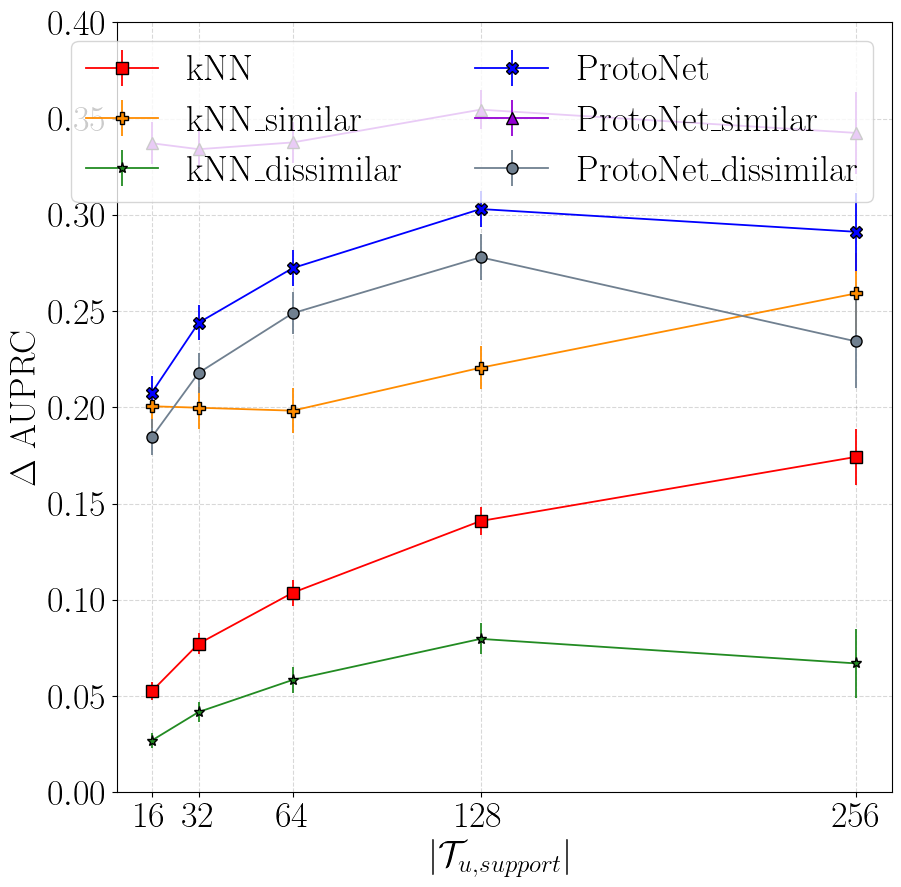

In [17]:
# this function has the option to plot all classes separately.
plot_by_size(aggregate_df, model_summaries, plot_output_dir = plot_output_dir)

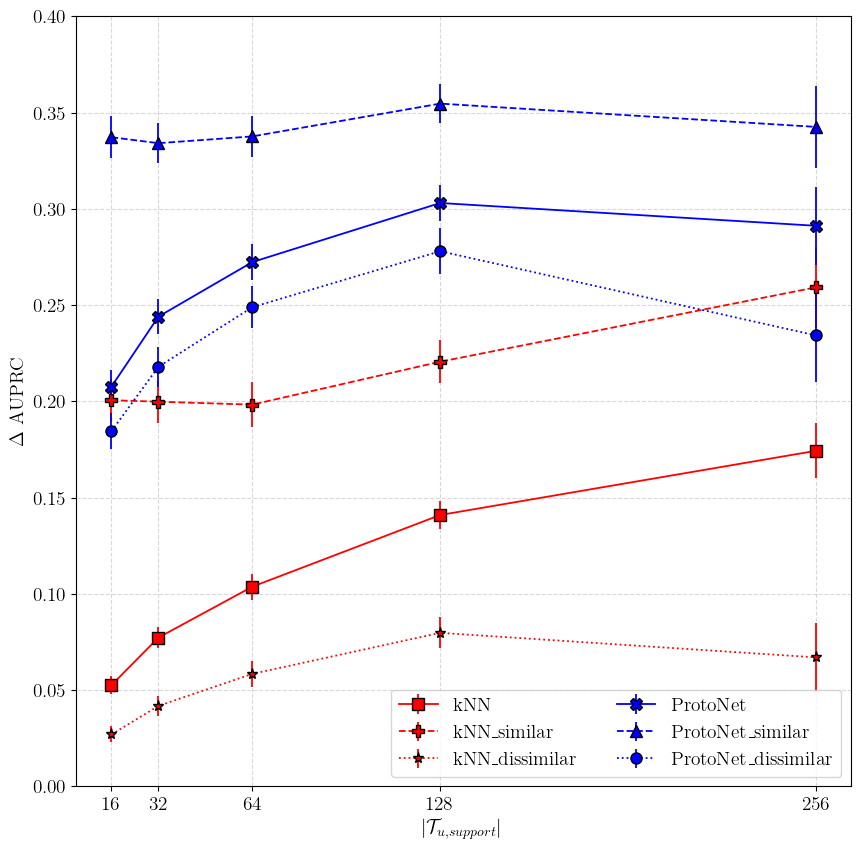

In [18]:
plot_by_size_new(aggregate_df, model_summaries, plot_output_dir = plot_output_dir)

In [14]:
from autorank import autorank

# select correct data to rank with autorank
for size in [16]:

    df = data[[x for x in list(data.columns) if x.startswith(f"{size}") and "val" in x and "delta-auprc" in x]]

In [15]:
result = autorank(df, verbose=False)
result.rankdf["meanrank"]

16_train (kNN_dissimilar) val delta-auprc         5.563694
16_train (kNN) val delta-auprc                    4.974522
16_train (ProtoNet_dissimilar) val delta-auprc    3.270701
16_train (kNN_similar) val delta-auprc            3.153846
16_train (ProtoNet) val delta-auprc               2.703822
16_train (ProtoNet_similar) val delta-auprc       1.291667
Name: meanrank, dtype: float64

In [16]:
data

,chembl_id,target_id,confidence,component_synonym,type_synonym,protein_class_desc,pref_name,EC_super_class,EC_super_class_name,protein_family,...,128_train (kNN_dissimilar) val delta-auprc,128_train (ProtoNet) val delta-auprc,128_train (ProtoNet_similar) val delta-auprc,128_train (ProtoNet_dissimilar) val delta-auprc,256_train (kNN) val delta-auprc,256_train (kNN_similar) val delta-auprc,256_train (kNN_dissimilar) val delta-auprc,256_train (ProtoNet) val delta-auprc,256_train (ProtoNet_similar) val delta-auprc,256_train (ProtoNet_dissimilar) val delta-auprc
0,CHEMBL1119333,93,8,3.1.1.7,EC_NUMBER,enzyme hydrolase,Hydrolase,3,hydrolase,hydrolase,...,0.031000,0.351000,0.362000,0.213000,0.311000,0.323000,-0.061000,0.360000,0.367000,0.353000
1,CHEMBL1243967,11177,8,2.7.1.153,EC_NUMBER,enzyme transferase,Transferase,2,transferase,transferase,...,-0.100000,0.359000,0.361000,-0.083000,NaN,NaN,NaN,NaN,NaN,NaN
2,CHEMBL1243970,10056,8,2.7.11.1,EC_NUMBER,enzyme kinase protein kinase atypical pikk,Atypical protein kinase PIKK family,2,transferase,kinase_atypical,...,-0.108000,0.312000,0.323000,0.187000,NaN,NaN,NaN,NaN,NaN,NaN
3,CHEMBL1614292,101284,8,2.7.1.11,EC_NUMBER,enzyme,Enzyme,2,transferase,undefined enzyme/protein,...,0.013875,0.044875,0.349875,0.041875,0.024875,0.165875,0.021875,0.064875,0.314875,0.059875
4,CHEMBL1614433,103718,8,3.1.21.2,EC_NUMBER,enzyme hydrolase,Hydrolase,3,hydrolase,hydrolase,...,0.066094,0.110094,0.105094,0.117094,0.099094,-0.007906,0.099094,0.136094,0.151094,0.142094
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
152,CHEMBL3707738,38,9,3.3.2.9,EC_NUMBER,enzyme protease serine sc s33,Serine protease S33 family,3,hydrolase,protease_serine,...,-0.007047,0.251953,0.256953,0.346953,NaN,NaN,NaN,NaN,NaN,NaN
153,CHEMBL4005586,100447,9,2.3.1.286,EC_NUMBER,epigenetic regulator eraser hdac hdac class...,HDAC class III,2,transferase,epigenetic_regulator,...,NaN,0.221302,0.221302,NaN,NaN,NaN,NaN,NaN,NaN,NaN
154,CHEMBL4133035,12054,9,"('1.13.11.-', '1.13.11.12', '1.13.11.31', '1.1...",EC_NUMBER,enzyme reductase,Oxidoreductase,1,oxidoreductase,reductase,...,0.242000,0.151000,0.127000,0.267000,NaN,NaN,NaN,NaN,NaN,NaN
155,CHEMBL641707,11203,9,2.3.1.26,EC_NUMBER,enzyme transferase,Transferase,2,transferase,transferase,...,NaN,0.455198,0.459198,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
# a dictionary summarising all models to be compared. Add new paths here as desired.
model_summaries_16 = {
    "kNN": os.path.join(results_path, "FSMol_Eval_kNN_2023-01-31_14-35-49", "summary", "kNN_summary_num_train_requested_16.csv"),
    "kNN_similar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_16-28-43", "summary", "kNN_summary_num_train_requested_16.csv"),
    "kNN_dissimilar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_17-19-58", "summary", "kNN_summary_num_train_requested_16.csv"),
    "ProtoNet": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-15_12-21-54", "summary", "ProtoNet_summary_num_train_requested_16.csv"),
    "ProtoNet_similar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-23_20-06-40", "summary", "ProtoNet_summary_num_train_requested_16.csv"),
    "ProtoNet_dissimilar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-24_00-15-11", "summary", "ProtoNet_summary_num_train_requested_16.csv"),
#     "kNN": os.path.join(results_path, "kNN_summary.csv"),
}

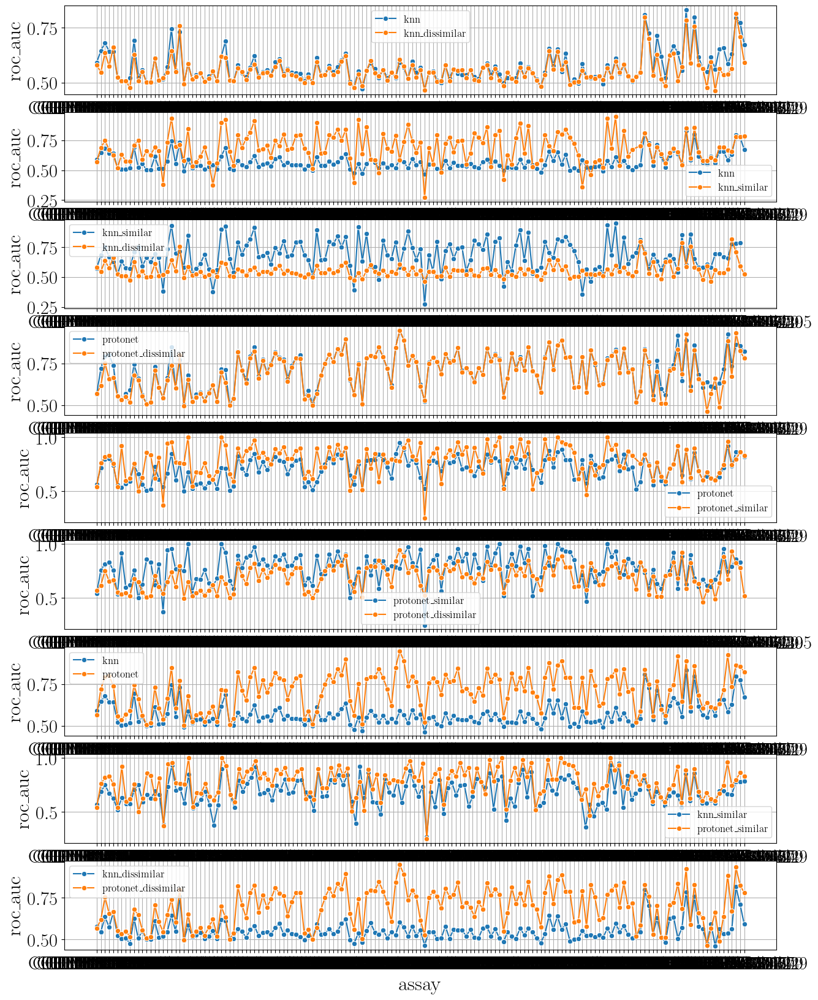

In [10]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

light_color = plt.get_cmap("plasma").colors[170]
dark_color = "black"

plt.rcParams.update(
    {
        "font.size": 20,
        "text.usetex": True,
        "font.family": "serif",
        "font.serif": "Computer Modern Roman",
    }
)

plt.rc("axes", labelsize=24)  # fontsize of the x and y labels
plt.rc("legend", fontsize=12)  # fontsize of the legend
plt.rc("xtick", labelsize=22)
plt.rc("ytick", labelsize=22)

fig, ax = plt.subplots(9, 1, figsize=(15, 20))

knn_16 = pd.read_csv(model_summaries_16['kNN'])
knn_similar_16 = pd.read_csv(model_summaries_16['kNN_similar'])
knn_dissimilar_16 = pd.read_csv(model_summaries_16['kNN_dissimilar'])

protonet_16 = pd.read_csv(model_summaries_16['ProtoNet'])
protonet_similar_16 = pd.read_csv(model_summaries_16['ProtoNet_similar'])
protonet_dissimilar_16 = pd.read_csv(model_summaries_16['ProtoNet_dissimilar'])

sns.lineplot(knn_16, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[0])
sns.lineplot(knn_dissimilar_16, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[0])
ax[0].legend()
ax[0].grid()

sns.lineplot(knn_16, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[1])
sns.lineplot(knn_similar_16, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[1])
ax[1].legend()
ax[1].grid()


sns.lineplot(knn_similar_16, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[2])
sns.lineplot(knn_dissimilar_16, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[2])
ax[2].legend()
ax[2].grid()


sns.lineplot(protonet_16, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[3])
sns.lineplot(protonet_dissimilar_16, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[3])
ax[3].legend()
ax[3].grid()

sns.lineplot(protonet_16, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[4])
sns.lineplot(protonet_similar_16, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[4])
ax[4].legend()
ax[4].grid()


sns.lineplot(protonet_similar_16, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[5])
sns.lineplot(protonet_dissimilar_16, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[5])
ax[5].legend()
ax[5].grid()

sns.lineplot(knn_16, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[6])
sns.lineplot(protonet_16, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[6])
ax[6].legend()
ax[6].grid()

sns.lineplot(knn_similar_16, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[7])
sns.lineplot(protonet_similar_16, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[7])
ax[7].legend()
ax[7].grid()


sns.lineplot(knn_dissimilar_16, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[8])
sns.lineplot(protonet_dissimilar_16, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[8])
ax[8].legend()
ax[8].grid()


[[(0.2, 1.0)], [(0.2, 1.0)], [(0.2, 1.0)]]

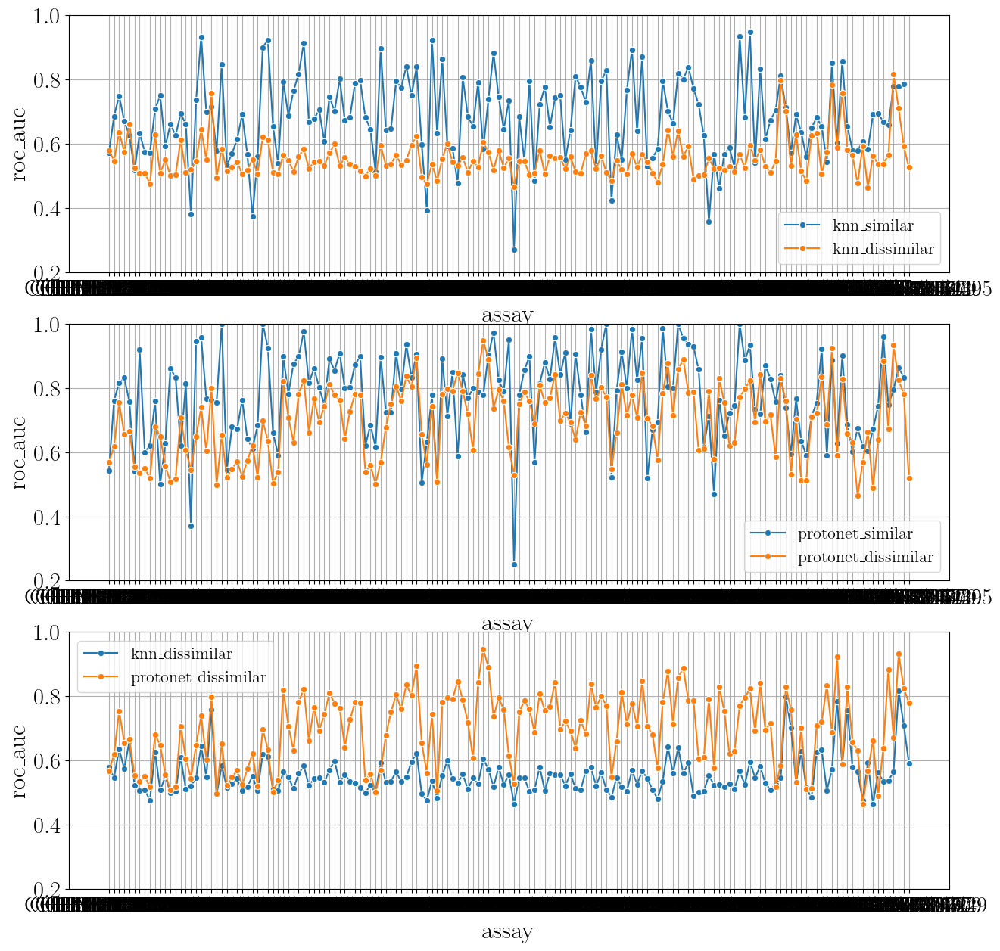

In [13]:
fig, ax = plt.subplots(3, 1, figsize=(15, 15))
plt.rc("legend", fontsize=16)  # fontsize of the legend


sns.lineplot(knn_similar_16, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[0])
sns.lineplot(knn_dissimilar_16, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[0])
ax[0].legend()
ax[0].grid()

sns.lineplot(protonet_similar_16, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[1])
sns.lineplot(protonet_dissimilar_16, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[1])
ax[1].legend()
ax[1].grid()


sns.lineplot(knn_dissimilar_16, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[2])
sns.lineplot(protonet_dissimilar_16, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[2])
ax[2].legend()
ax[2].grid()

[ax[i].set(ylim=(0.2, 1.0)) for i in range(3)]



In [42]:
# a dictionary summarising all models to be compared. Add new paths here as desired.
model_summaries_32 = {
    "kNN": os.path.join(results_path, "FSMol_Eval_kNN_2023-01-31_14-35-49", "summary", "kNN_summary_num_train_requested_32.csv"),
    "kNN_similar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_16-28-43", "summary", "kNN_summary_num_train_requested_32.csv"),
    "kNN_dissimilar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_17-19-58", "summary", "kNN_summary_num_train_requested_32.csv"),
    "ProtoNet": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-15_12-21-54", "summary", "ProtoNet_summary_num_train_requested_32.csv"),
    "ProtoNet_similar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-23_20-06-40", "summary", "ProtoNet_summary_num_train_requested_32.csv"),
    "ProtoNet_dissimilar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-24_00-15-11", "summary", "ProtoNet_summary_num_train_requested_32.csv"),
#     "kNN": os.path.join(results_path, "kNN_summary.csv"),
}

findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following families were found: Computer Modern Roman
findfont: Generic family 'serif' not found because none of the following

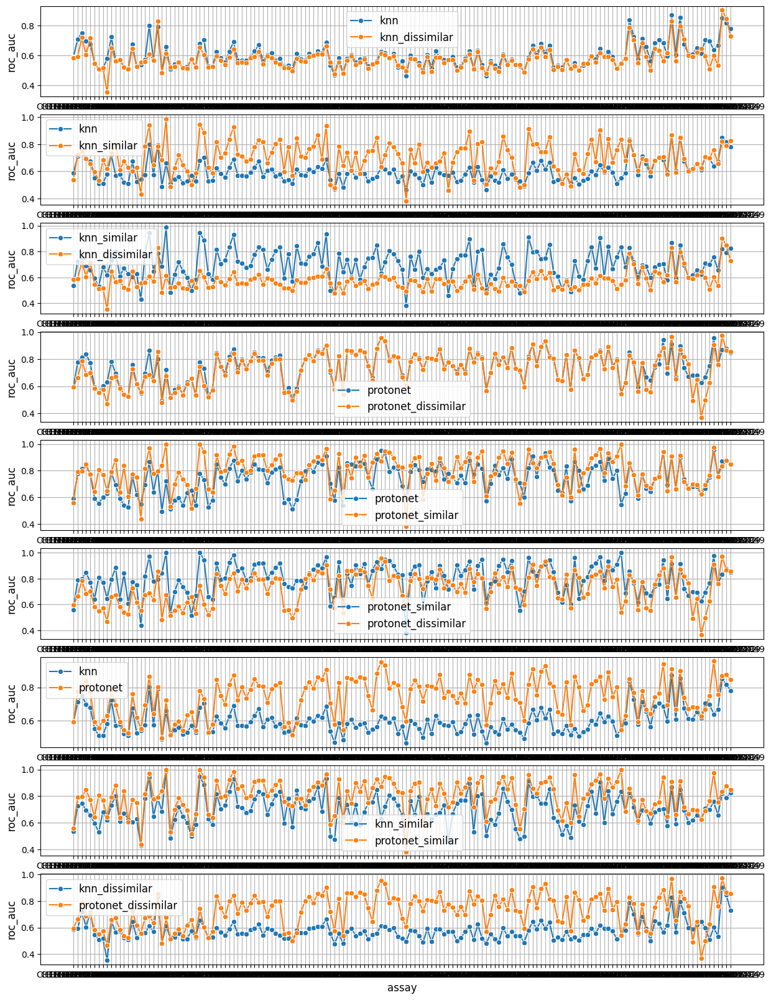

In [53]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(9, 1, figsize=(15, 20))

knn_32 = pd.read_csv(model_summaries_32['kNN'])
knn_similar_32 = pd.read_csv(model_summaries_32['kNN_similar'])
knn_dissimilar_32 = pd.read_csv(model_summaries_32['kNN_dissimilar'])

protonet_32 = pd.read_csv(model_summaries_32['ProtoNet'])
protonet_similar_32 = pd.read_csv(model_summaries_32['ProtoNet_similar'])
protonet_dissimilar_32 = pd.read_csv(model_summaries_32['ProtoNet_dissimilar'])

sns.lineplot(knn_32, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[0])
sns.lineplot(knn_dissimilar_32, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[0])
ax[0].legend()
ax[0].grid()

sns.lineplot(knn_32, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[1])
sns.lineplot(knn_similar_32, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[1])
ax[1].legend()
ax[1].grid()


sns.lineplot(knn_similar_32, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[2])
sns.lineplot(knn_dissimilar_32, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[2])
ax[2].legend()
ax[2].grid()


sns.lineplot(protonet_32, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[3])
sns.lineplot(protonet_dissimilar_32, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[3])
ax[3].legend()
ax[3].grid()

sns.lineplot(protonet_32, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[4])
sns.lineplot(protonet_similar_32, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[4])
ax[4].legend()
ax[4].grid()


sns.lineplot(protonet_similar_32, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[5])
sns.lineplot(protonet_dissimilar_32, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[5])
ax[5].legend()
ax[5].grid()

sns.lineplot(knn_32, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[6])
sns.lineplot(protonet_32, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[6])
ax[6].legend()
ax[6].grid()

sns.lineplot(knn_similar_32, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[7])
sns.lineplot(protonet_similar_32, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[7])
ax[7].legend()
ax[7].grid()


sns.lineplot(knn_dissimilar_32, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[8])
sns.lineplot(protonet_dissimilar_32, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[8])
ax[8].legend()
ax[8].grid()


In [15]:
# a dictionary summarising all models to be compared. Add new paths here as desired.
model_summaries_64 = {
    "kNN": os.path.join(results_path, "FSMol_Eval_kNN_2023-01-31_14-35-49", "summary", "kNN_summary_num_train_requested_64.csv"),
    "kNN_similar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_16-28-43", "summary", "kNN_summary_num_train_requested_64.csv"),
    "kNN_dissimilar": os.path.join(results_path, "FSMol_Eval_kNN_2023-02-23_17-19-58", "summary", "kNN_summary_num_train_requested_64.csv"),
    "ProtoNet": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-15_12-21-54", "summary", "ProtoNet_summary_num_train_requested_64.csv"),
    "ProtoNet_similar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-23_20-06-40", "summary", "ProtoNet_summary_num_train_requested_64.csv"),
    "ProtoNet_dissimilar": os.path.join(results_path, "FSMol_Eval_ProtoNet_2023-02-24_00-15-11", "summary", "ProtoNet_summary_num_train_requested_64.csv"),
#     "kNN": os.path.join(results_path, "kNN_summary.csv"),
}

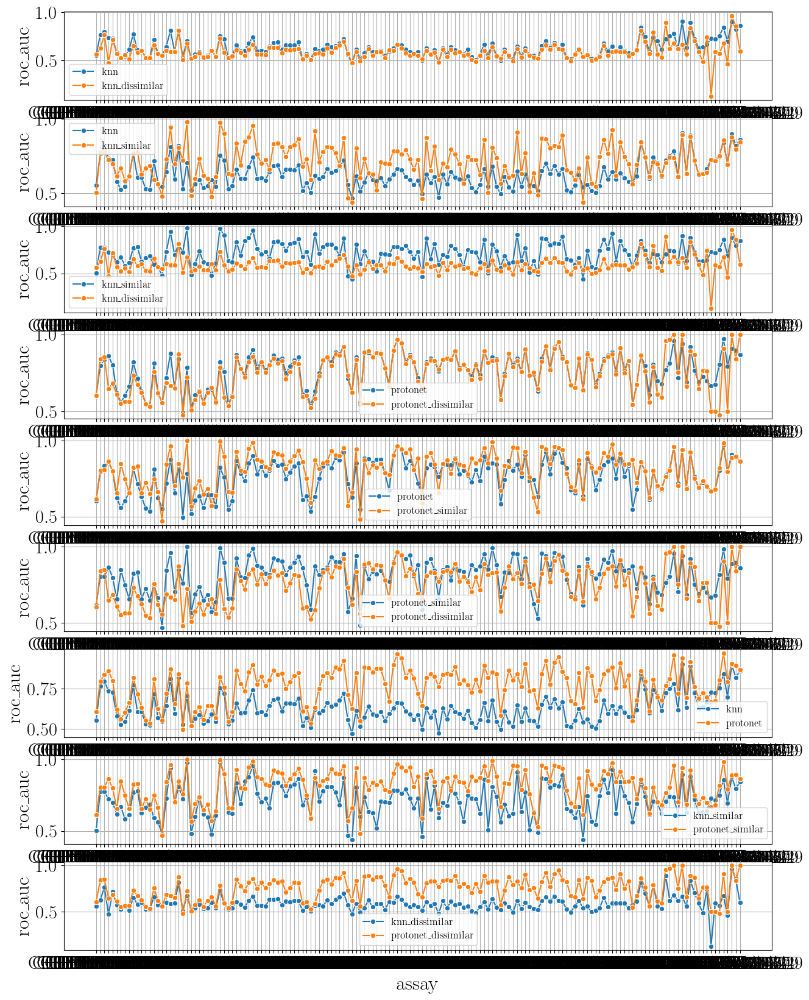

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

plt.rc("legend", fontsize=12)  # fontsize of the legend

fig, ax = plt.subplots(9, 1, figsize=(15, 20))


knn_64 = pd.read_csv(model_summaries_64['kNN'])
knn_similar_64 = pd.read_csv(model_summaries_64['kNN_similar'])
knn_dissimilar_64 = pd.read_csv(model_summaries_64['kNN_dissimilar'])

protonet_64 = pd.read_csv(model_summaries_64['ProtoNet'])
protonet_similar_64 = pd.read_csv(model_summaries_64['ProtoNet_similar'])
protonet_dissimilar_64 = pd.read_csv(model_summaries_64['ProtoNet_dissimilar'])

sns.lineplot(knn_64, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[0])
sns.lineplot(knn_dissimilar_64, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[0])
ax[0].legend()
ax[0].grid()

sns.lineplot(knn_64, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[1])
sns.lineplot(knn_similar_64, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[1])
ax[1].legend()
ax[1].grid()


sns.lineplot(knn_similar_64, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[2])
sns.lineplot(knn_dissimilar_64, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[2])
ax[2].legend()
ax[2].grid()


sns.lineplot(protonet_64, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[3])
sns.lineplot(protonet_dissimilar_64, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[3])
ax[3].legend()
ax[3].grid()

sns.lineplot(protonet_64, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[4])
sns.lineplot(protonet_similar_64, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[4])
ax[4].legend()
ax[4].grid()


sns.lineplot(protonet_similar_64, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[5])
sns.lineplot(protonet_dissimilar_64, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[5])
ax[5].legend()
ax[5].grid()

sns.lineplot(knn_64, x= 'assay', y='roc_auc', label= 'knn', marker="o", ax = ax[6])
sns.lineplot(protonet_64, x= 'assay', y='roc_auc', label= 'protonet', marker="o", ax = ax[6])
ax[6].legend()
ax[6].grid()

sns.lineplot(knn_similar_64, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[7])
sns.lineplot(protonet_similar_64, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[7])
ax[7].legend()
ax[7].grid()


sns.lineplot(knn_dissimilar_64, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[8])
sns.lineplot(protonet_dissimilar_64, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[8])
ax[8].legend()
ax[8].grid()

[[(0.2, 1.0)], [(0.2, 1.0)], [(0.2, 1.0)]]

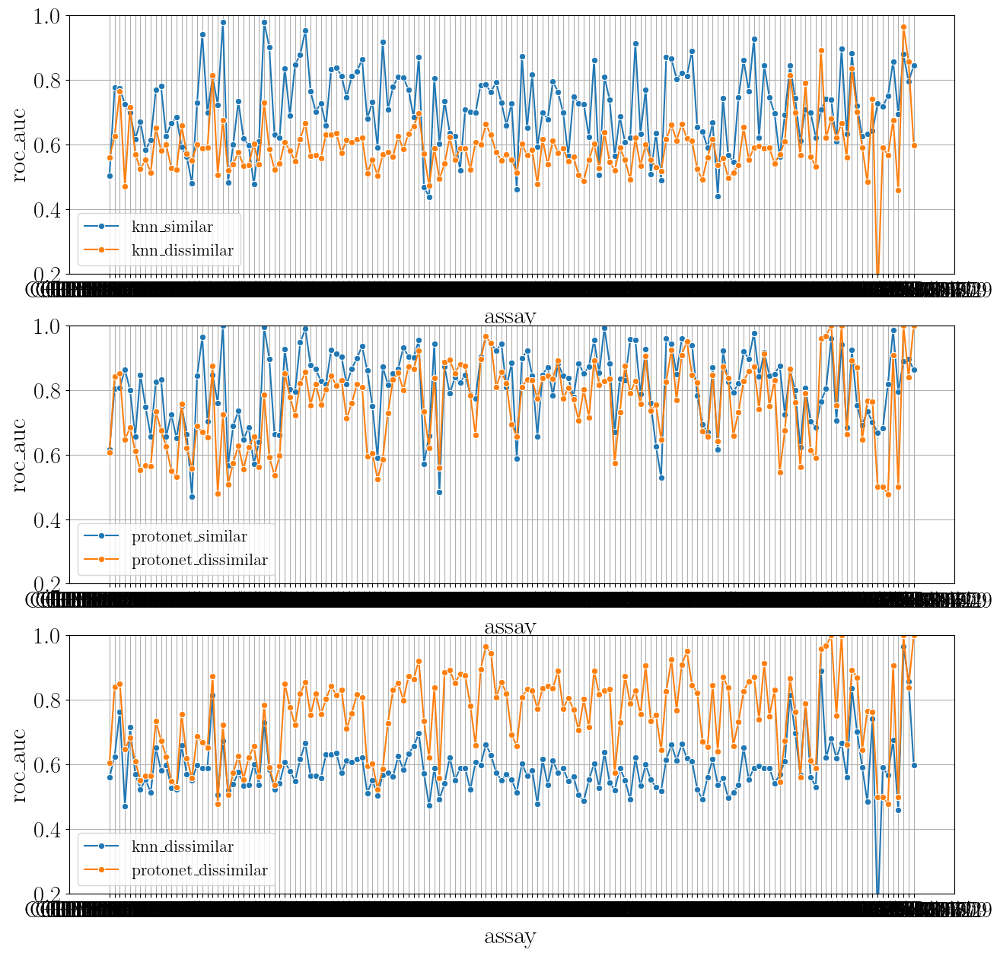

In [18]:
fig, ax = plt.subplots(3, 1, figsize=(15, 15))
plt.rc("legend", fontsize=16)  # fontsize of the legend


sns.lineplot(knn_similar_64, x= 'assay', y='roc_auc', label= 'knn_similar', marker="o", ax = ax[0])
sns.lineplot(knn_dissimilar_64, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[0])
ax[0].legend()
ax[0].grid()

sns.lineplot(protonet_similar_64, x= 'assay', y='roc_auc', label= 'protonet_similar', marker="o", ax = ax[1])
sns.lineplot(protonet_dissimilar_64, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[1])
ax[1].legend()
ax[1].grid()


sns.lineplot(knn_dissimilar_64, x= 'assay', y='roc_auc', label= 'knn_dissimilar', marker="o", ax = ax[2])
sns.lineplot(protonet_dissimilar_64, x= 'assay', y='roc_auc', label= 'protonet_dissimilar', marker="o", ax = ax[2])
ax[2].legend()
ax[2].grid()

[ax[i].set(ylim=(0.2, 1.0)) for i in range(3)]